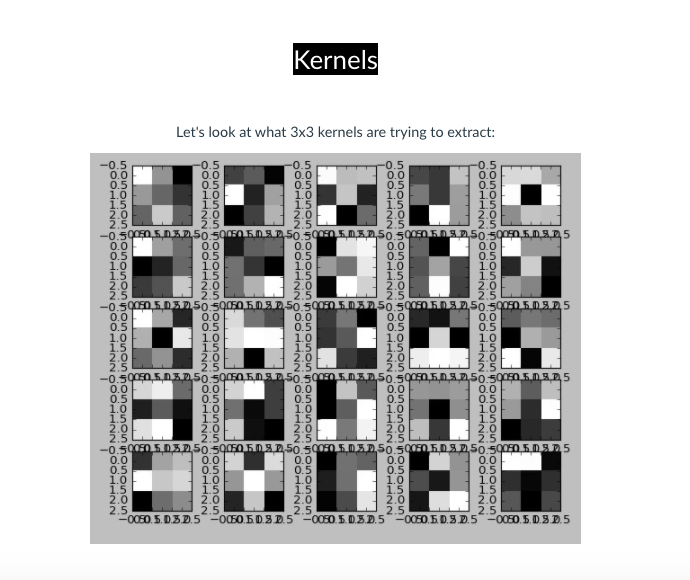

We really cannot find any pattern here. 3x3 is a very small area to actually gather any Perceivable information (for human eyes), especially when we are referring to an image of size 400x400. 

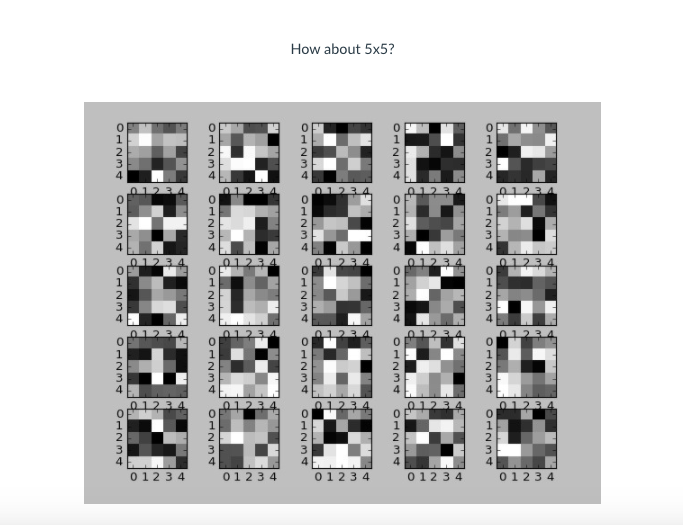

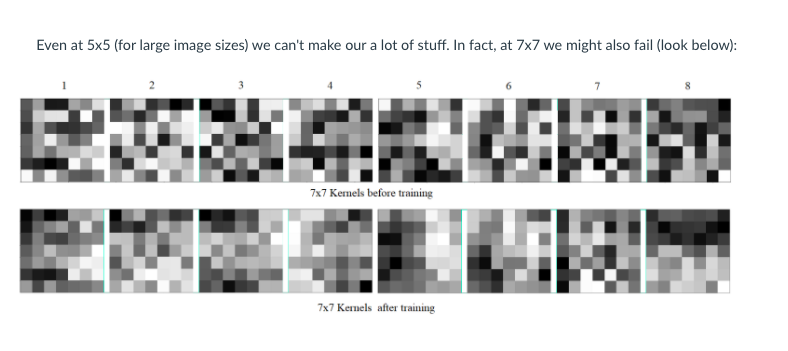

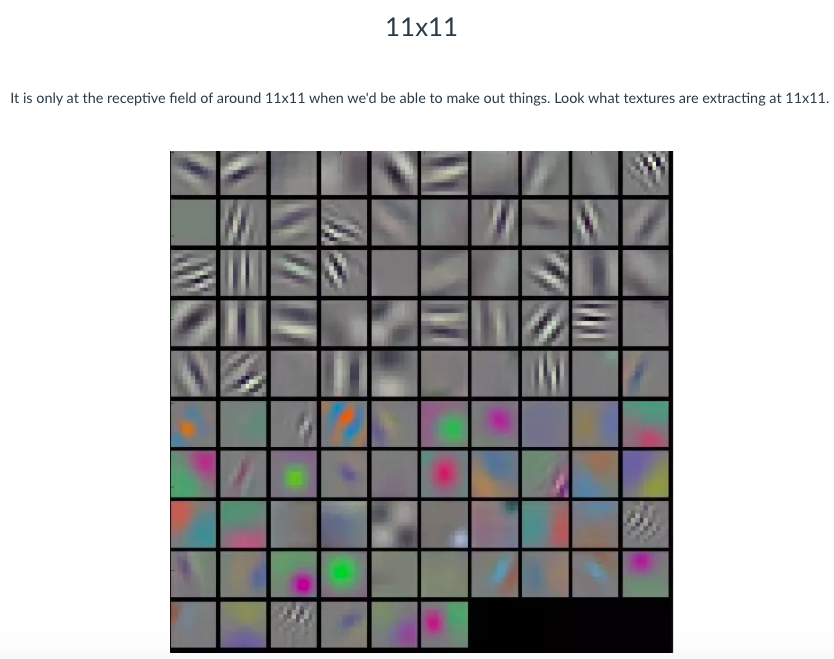

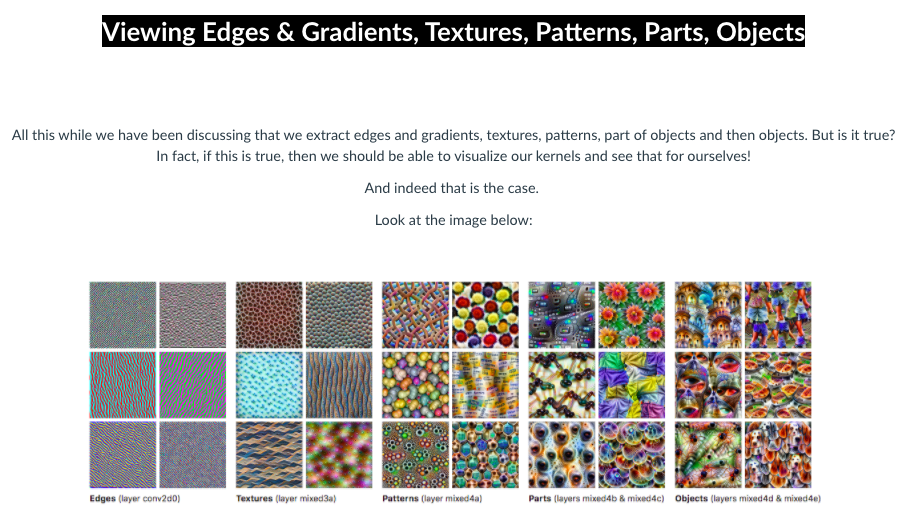

# Convolution

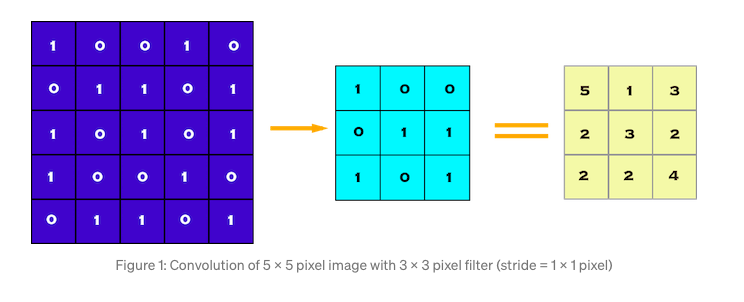

In [ ]:
Receptive Field

image   kernel/Feature extractor/Filter
5x5    -   3x3                          = 3x3
7x7    -   3x3                          = 5x5
9x9    -   3x3                          = 7x7
11x11   -  3x3                          = 9x9
....
...

c- 400x400  - 3x3                         = 398 x 398
c- 398 x398 - 3x3                          = 396 x396
c- 396 x396 - 3x3                          = 394 x394
m - 396 x396 - 2x2                         = 188x 188
c- 188 x 188 - 3x3                         =186x186
c- 186x186.  - 3x3                         =184 x184
c- 184 x184  - 3x3                          =182x182
m - 182x182 - 2x2                           = 91x91
......
......
.....
60 x60  - 3x3                           =58 x58
                                         =1x1

# Maxpooling

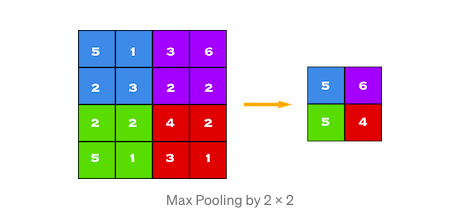

In [ ]:

4x4 - 2x2(Avg pooling)  - 2x2

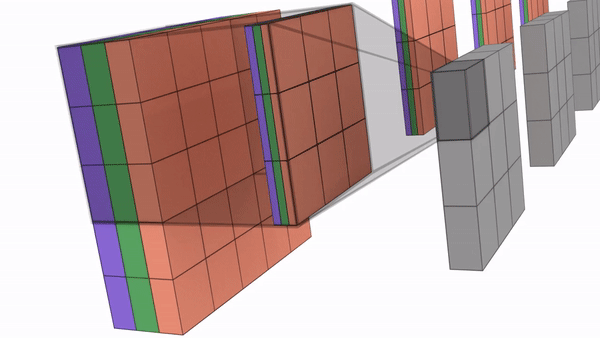

# Maxpooling

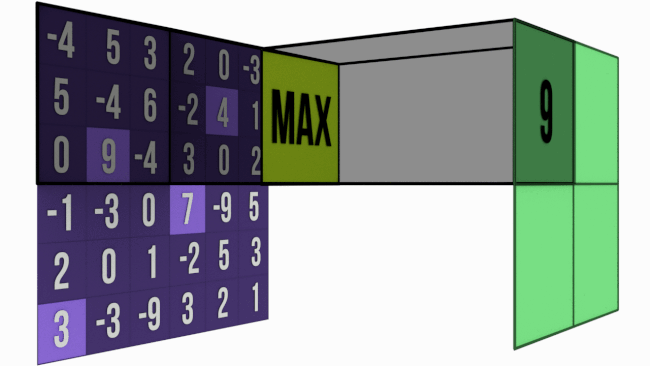

In [4]:
!pip install torchvision

     |████████████████████████████████| 1.0 MB 305 kB/s eta 0:00:01


In [37]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
from torchvision import datasets, transforms

In [39]:
# Train Phase transformations
train_transforms = transforms.Compose([
                                       transforms.ToTensor(),
                                       transforms.Normalize((0.1307,), (0.3081,)) # The mean and std have to be sequences (e.g., tuples), therefore you should add a comma after the values. 
                                       ])

# Test Phase transformations
test_transforms = transforms.Compose([
                                       transforms.ToTensor(),
                                       transforms.Normalize((0.1307,), (0.3081,))
                                       ])

In [40]:
train = datasets.MNIST('./data', train=True, download=True, transform=train_transforms)
test = datasets.MNIST('./data', train=False, download=True, transform=test_transforms)

In [41]:
SEED = 1

# CUDA?
cuda = torch.cuda.is_available()
print("CUDA Available?", cuda)

# For reproducibility
torch.manual_seed(SEED)

if cuda:
    torch.cuda.manual_seed(SEED)

# dataloader arguments - something you'll fetch these from cmdprmt
batch_size_cuda = 24 #32
batch_size_cpu = 24 #32

dataloader_args = dict(shuffle=True, batch_size=batch_size_cuda, num_workers=4, pin_memory=True) if cuda else dict(shuffle=True, batch_size=batch_size_cpu)

# train dataloader
train_loader = torch.utils.data.DataLoader(train, **dataloader_args)

# test dataloader
test_loader = torch.utils.data.DataLoader(test, **dataloader_args)

CUDA Available? False


[Train]
 - Numpy Shape: (60000, 28, 28)
 - Tensor Shape: torch.Size([60000, 28, 28])
 - min: tensor(-0.4242)
 - max: tensor(2.8215)
 - mean: tensor(-0.0001)
 - std: tensor(1.0000)
 - var: tensor(1.0001)
torch.Size([24, 1, 28, 28])
torch.Size([24])


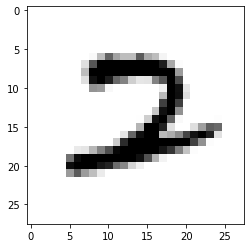

In [45]:
# We'd need to convert it into Numpy! Remember above we have converted it into tensors already
train_data = train.train_data
train_data = train.transform(train_data.numpy())

print('[Train]')
print(' - Numpy Shape:', train.train_data.cpu().numpy().shape)
print(' - Tensor Shape:', train.train_data.size())
print(' - min:', torch.min(train_data))
print(' - max:', torch.max(train_data))
print(' - mean:', torch.mean(train_data))
print(' - std:', torch.std(train_data))
print(' - var:', torch.var(train_data))

dataiter = iter(train_loader)
images, labels = dataiter.next()

print(images.shape)
print(labels.shape)

# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

plt.imshow(images[9].numpy().squeeze(), cmap='gray_r')

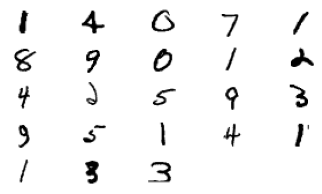

In [30]:
figure = plt.figure()
num_of_images = 23
for index in range(1, num_of_images + 1):
    plt.subplot(6, 5, index)
    plt.axis('off')
    plt.imshow(images[index].numpy().squeeze(), cmap='gray_r')

In [46]:
dropout_value = 0.1
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # Input Block
        self.convblock1 = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(8),
            nn.Dropout(dropout_value)
        ) # In: 28x28x1 | Out: 26x26x8 | RF: 3

        # CONVOLUTION BLOCK 1
        self.convblock2 = nn.Sequential(
            nn.Conv2d(in_channels=8, out_channels=10, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(10),
            nn.Dropout(dropout_value)
        ) # In: 26x26x8 | Out: 24x24x10 | RF: 5

        self.convblock3 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=12, kernel_size=(3, 3), padding=0, bias=False),
            
        ) # In: 24x24x10 | Out: 22x22x12 | RF: 7

         # TRANSITION BLOCK 1
        self.pool1 = nn.MaxPool2d(2, 2) # In: 22x22x12 | Out: 11x11x12 | RF: 8

        # CONVOLUTION BLOCK 2
        self.convblock5 = nn.Sequential(
            nn.Conv2d(in_channels=12, out_channels=16, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.Dropout(dropout_value)
        ) # In: 11x11x12 | Out: 9x9x16 | RF: 12

        self.convblock6 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.Dropout(dropout_value)
        ) # In: 9x9x16 | Out: 7x7x16 | RF: 16
        self.convblock7 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.Dropout(dropout_value)
        ) # In: 7x7x16 | Out: 5x5x16 | RF: 20

        # OUTPUT BLOCK
        self.gap = nn.Sequential(
            nn.AdaptiveAvgPool2d(output_size=1)
        ) # In: 5x5x16 | Out: 1x1x16 | RF: 28
        self.convblock8 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=10, kernel_size=(1, 1), padding=0, bias=False),
            # nn.ReLU() NEVER!
        ) # In: 1x1x16 | Out: 1x1x10 | RF: 28


    def forward(self, x):
        x = self.convblock1(x)
        x = self.convblock2(x)
        x = self.convblock3(x)
        x = self.pool1(x)
        x = self.convblock5(x)
        x = self.convblock6(x)
        x = self.convblock7(x)
        x = self.gap(x)
        x = self.convblock8(x)
        x = x.view(-1, 10)
        return F.log_softmax(x, dim=-1)

In [47]:
!pip install torchsummary
from torchsummary import summary
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)
model = Net().to(device)
summary(model, input_size=(1, 28, 28))

cpu
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 26, 26]              72
              ReLU-2            [-1, 8, 26, 26]               0
       BatchNorm2d-3            [-1, 8, 26, 26]              16
           Dropout-4            [-1, 8, 26, 26]               0
            Conv2d-5           [-1, 10, 24, 24]             720
              ReLU-6           [-1, 10, 24, 24]               0
       BatchNorm2d-7           [-1, 10, 24, 24]              20
           Dropout-8           [-1, 10, 24, 24]               0
            Conv2d-9           [-1, 12, 22, 22]           1,080
        MaxPool2d-10           [-1, 12, 11, 11]               0
           Conv2d-11             [-1, 16, 9, 9]           1,728
             ReLU-12             [-1, 16, 9, 9]               0
      BatchNorm2d-13             [-1, 16, 9, 9]              32
          Dropout-14             [-

In [49]:
from tqdm import tqdm

def train(model, device, train_loader, optimizer, epoch, l1_decay, l2_decay):
  model.train()
  pbar = tqdm(train_loader)
  correct = 0
  processed = 0
  for batch_idx, (data, target) in enumerate(pbar):
    # get samples
    data, target = data.to(device), target.to(device)

    # Init
    optimizer.zero_grad()
    # In PyTorch, we need to set the gradients to zero before starting to do backpropragation because PyTorch accumulates the gradients on subsequent backward passes. 
    # Because of this, when you start your training loop, ideally you should zero out the gradients so that you do the parameter update correctly.

    # Predict
    y_pred = model(data)

    # Calculate loss
    loss = F.nll_loss(y_pred, target)
    if l1_decay > 0:
      l1_loss = 0
      for param in model.parameters():
        l1_loss += torch.norm(param,1)
      loss += l1_decay * l1_loss
    if l2_decay > 0:
      l2_loss = 0
      for param in model.parameters():
        l2_loss += torch.norm(param,2)
      loss += l2_decay * l2_loss

    # Backpropagation
    loss.backward()
    optimizer.step()

    # Update pbar-tqdm
    
    pred = y_pred.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
    correct += pred.eq(target.view_as(pred)).sum().item()
    processed += len(data)

    pbar_str = f'Loss={loss.item()} Batch_id={batch_idx} Accuracy={100*correct/processed:0.2f}'
    if l1_decay > 0:
      pbar_str = f'L1_loss={l1_loss.item()} %s' % (pbar_str)
    if l2_decay > 0:
      pbar_str = f'L2_loss={l2_loss.item()} %s' % (pbar_str)

    pbar.set_description(desc= pbar_str)

def test(model, device, test_loader, test_losses, test_acc, misclassified_imgs, is_last_epoch):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            is_correct = pred.eq(target.view_as(pred))
            if is_last_epoch:
              misclassified_inds = (is_correct==0).nonzero()[:,0]
              for mis_ind in misclassified_inds:
                if len(misclassified_imgs) == 25:
                  break
                misclassified_imgs.append({
                    "target": target[mis_ind].cpu().numpy(),
                    "pred": pred[mis_ind][0].cpu().numpy(),
                    "img": data[mis_ind].cpu().numpy()[0]
                })
            correct += is_correct.sum().item()

    test_loss /= len(test_loader.dataset)
    test_losses.append(test_loss)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.2f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    test_acc.append(100. * correct / len(test_loader.dataset))

def run(l1_decay=0.0, l2_decay=0.0):
  model =  Net().to(device)
  optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
  scheduler = StepLR(optimizer, step_size=6, gamma=0.1)
  EPOCHS = 1
  test_losses = []
  test_acc = []
  misclassified_imgs = []
  for epoch in range(EPOCHS):
      print("EPOCH:", epoch+1)
      train(model, device, train_loader, optimizer, epoch, l1_decay, l2_decay)
      scheduler.step()
      test(model, device, test_loader, test_losses, test_acc, misclassified_imgs, epoch==EPOCHS-1)
  return test_losses, test_acc, misclassified_imgs

In [50]:
# without l1 and l2
test_losses, test_acc, misclassified_imgs = run(l1_decay=0.0, l2_decay=0.0)

  0%|          | 0/2500 [00:00<?, ?it/s]

EPOCH: 1


Loss=0.024055147543549538 Batch_id=2499 Accuracy=94.44: 100%|██████████| 2500/2500 [05:31<00:00,  7.55it/s] 



Test set: Average loss: 0.0575, Accuracy: 9822/10000 (98.22%)



In [17]:
# with l1
test_losses_l1, test_acc_l1, misclassified_imgs_l1 = run(l1_decay=0.0005, l2_decay=0.0)

L1_loss=468.1387634277344 Loss=2.485922336578369 Batch_id=3 Accuracy=13.54:   0%|          | 3/2500 [00:00<01:46, 23.51it/s]

EPOCH: 1


L1_loss=467.0465087890625 Loss=0.2833571434020996 Batch_id=2499 Accuracy=93.73: 100%|██████████| 2500/2500 [01:33<00:00, 26.68it/s]  



Test set: Average loss: 0.0705, Accuracy: 9791/10000 (97.91%)



In [18]:
# with l2
test_losses_l2, test_acc_l2, misclassified_imgs_l2 = run(l1_decay=0.0, l2_decay=0.0005)

L2_loss=32.27249526977539 Loss=2.2753353118896484 Batch_id=3 Accuracy=10.42:   0%|          | 3/2500 [00:00<01:45, 23.75it/s]

EPOCH: 1


L2_loss=52.176448822021484 Loss=0.05663887411355972 Batch_id=2499 Accuracy=94.52: 100%|██████████| 2500/2500 [01:33<00:00, 26.66it/s] 



Test set: Average loss: 0.0496, Accuracy: 9849/10000 (98.49%)



In [19]:
# with l1 and l2
test_losses_l12, test_acc_l12, misclassified_imgs_l12 = run(l1_decay=0.0005, l2_decay=0.0005)

L2_loss=32.058536529541016 L1_loss=467.8134460449219 Loss=2.5374538898468018 Batch_id=3 Accuracy=13.54:   0%|          | 3/2500 [00:00<01:45, 23.74it/s]

EPOCH: 1


L2_loss=41.78028106689453 L1_loss=450.48785400390625 Loss=0.4160768389701843 Batch_id=2499 Accuracy=93.36: 100%|██████████| 2500/2500 [01:37<00:00, 25.68it/s]  



Test set: Average loss: 0.0726, Accuracy: 9782/10000 (97.82%)



In [1]:
from tqdm import tqdm

def train(model, device, train_loader, criterion, optimizer, epoch):
  model.train()
  pbar = tqdm(train_loader)
  correct = 0
  processed = 0
  for batch_idx, (data, target) in enumerate(pbar):
    # get samples
    data, target = data.to(device), target.to(device)

    # Init
    optimizer.zero_grad()
    # In PyTorch, we need to set the gradients to zero before starting to do backpropragation because PyTorch accumulates the gradients on subsequent backward passes. 
    # Because of this, when you start your training loop, ideally you should zero out the gradients so that you do the parameter update correctly.

    # Predict
    y_pred = model(data)

    # Calculate loss
    loss = criterion(y_pred, target)

    # Backpropagation
    loss.backward()
    optimizer.step()

    # Update pbar-tqdm
    pred = y_pred.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
    correct += pred.eq(target.view_as(pred)).sum().item()
    processed += len(data)

    pbar_str = f'Loss={loss.item()} Batch_id={batch_idx} Accuracy={100*correct/processed:0.2f}'
    pbar.set_description(desc= pbar_str)

In [3]:
import pprint

class ModelConfig(object):

    def __init__(self,):
        super(ModelConfig, self).__init__()
        self.seed = 1
        self.batch_size_cuda = 64
        self.batch_size_cpu = 64	
        self.num_workers = 4
        self.epochs = 10
        self.dropout_value = 0.15

    def print_config(self):
        print("Model Parameters:")
        pprint.pprint(vars(self), indent=2)

In [8]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim

#from config import ModelConfig
from data_engine import DataEngine
from model import Net
#from train import train
from test import test
from results import plot_misclassified_images, plot_graph
from utils import *

ModuleNotFoundError: No module named 'data_engine'

In [9]:
data = DataEngine(args)

# get some random training images
dataiter = iter(data.train_loader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images[:4]))
# print labels
print(' '.join('%5s' % data.classes[labels[j]] for j in range(4)))

NameError: name 'DataEngine' is not defined